IMPORT REQUIRED LIBRARIES

In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pydicom
from skimage import exposure, filters, feature
from scipy.ndimage import gaussian_filter, rotate
from skimage.transform import resize

LOAD DICOM SERIES

In [2]:
def load_dicom_folder(folder_path, modality=None):
    """
    Load a DICOM series from a folder into a 3D NumPy array.

    Parameters
    ----------
    folder_path : str
        Path to folder with DICOM files (all from same series).
    modality : str, optional
        "CT" or "MR" (used to decide slice order).

    Returns
    -------
    volume : np.ndarray
        3D array of stacked slices.
    header : pydicom Dataset
        Header of first slice.
    dicoms : list
        List of all DICOM datasets.
    voxel_size : tuple
        (dy, dx, dz) voxel dimensions in mm.
    """
    # Read all dicom files in folder
    dicoms = [pydicom.dcmread(os.path.join(folder_path, f))
              for f in os.listdir(folder_path)
              if not f.startswith('.')]

    # Sort by InstanceNumber
    reverse = True if modality == "CT" else False
    dicoms.sort(key=lambda d: int(d.InstanceNumber), reverse=reverse)

    # Stack into 3D volume
    if modality == "CT":
        # Convert to Hounsfield Units
        slices = []
        for d in dicoms:
            # Convert raw CT pixels to Hounsfield Units (HU)
            # HU = pixel_value * RescaleSlope + RescaleIntercept
            # Use defaults if fields are missing (slope=1, intercept=0)
            slope = getattr(d, 'RescaleSlope', 1.0)
            intercept = getattr(d, 'RescaleIntercept', 0.0)
            slices.append(d.pixel_array * slope + intercept)
        volume = np.stack(slices, axis=2)
    else:
        # MR: keep raw pixel values
        volume = np.stack([d.pixel_array for d in dicoms], axis=2)

    # Metadata
    header = dicoms[0]
    dx, dy = [float(sp) for sp in header.PixelSpacing]

    # Infer slice spacing from ImagePositionPatient
    z_positions = [float(d.ImagePositionPatient[2]) for d in dicoms]
    z_positions = np.sort(z_positions)
    dz = float(np.mean(np.diff(z_positions)))  # average slice spacing
    
    # nominal voxel size is defined from spacing between voxel centers
    voxel_size = (dy, dx, dz)

    return volume, header, dicoms, voxel_size


BASIC INFORMATION

In [4]:
# Paths to your CT and MR data (update before running!)
ct_path = "C:/Users/Public/DTU_studies/5th_semester/medical_imaging/project_CT/Dtu_A5-A8_22481-2/20251009/CT"

# Load CT
ct_img3d, ct_header, ct_dicoms, ct_voxel = load_dicom_folder(ct_path, modality="CT")
print("CT matrix size:", ct_img3d.shape)
print("CT voxel size (mm):", ct_voxel)
print("CT intensity range:", np.min(ct_img3d), np.max(ct_img3d))
print(ct_header)

CT matrix size: (512, 512, 652)
CT voxel size (mm): (0.585938, 0.585938, 0.625)
CT intensity range: -3024.0 3071.0
Dataset.file_meta -------------------------------
(0002,0000) File Meta Information Group Length  UL: 214
(0002,0001) File Meta Information Version       OB: b'\x00\x01'
(0002,0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002,0003) Media Storage SOP Instance UID      UI: 1.2.840.113619.2.290.3.397168944.825.1760016578.758.652
(0002,0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002,0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002,0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002,0017) Sending Application Entity Title    AE: 'BFHKFNM7101'
-------------------------------------------------
(0008,0005) Specific Character Set              CS: 'ISO_IR 100'
(0008,0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008,0012) Instance Creation Date              D

DISPLAY ORTHOGONAL SLICES

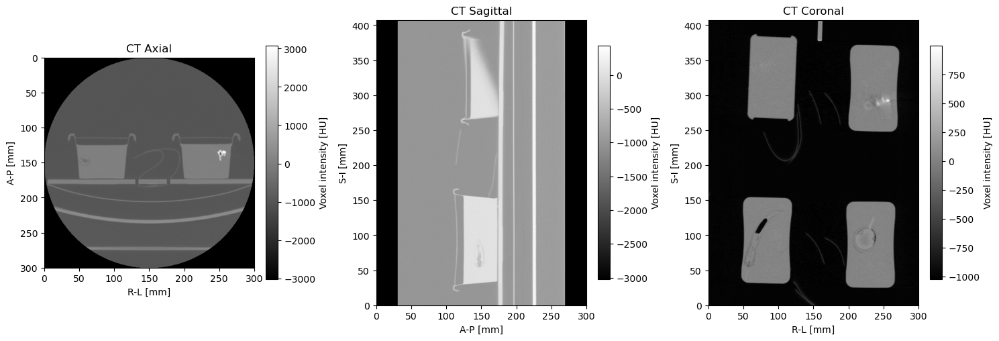

In [5]:
def show_slices(img3d, voxel_size, loc, colormap, title_prefix="", voxel_units=""):
    """Display axial, sagittal, coronal slices with correct aspect."""
    ny, nx, nz = img3d.shape

    # NB! loc is given in matrix size / grid units, whereas images are shown with axes in units of mm
    loc_AP = loc[0]
    loc_RL = loc[1]
    loc_SI = loc[2]

    # Physical lengths
    y_mm = ny * voxel_size[0]  # A-P
    x_mm = nx * voxel_size[1]  # R-L
    z_mm = nz * voxel_size[2]  # S-I

    fig, axes = plt.subplots(1, 3, figsize=(15, 10))

    # Axial
    axial = img3d[:, :, loc_SI]
    im = axes[0].imshow(axial, cmap=colormap, extent=[0, x_mm, y_mm, 0])
    axes[0].set_title(f'{title_prefix} Axial')
    axes[0].set_xlabel('R-L [mm]')
    axes[0].set_ylabel('A-P [mm]')
    plt.colorbar(im, ax=axes[0], fraction=0.05, pad=0.05, label=voxel_units)


    # Sagittal (A-P vs S-I)
    sagittal = np.rot90(img3d[:, loc_RL, :], 1)
    im = axes[1].imshow(sagittal, cmap=colormap, extent=[0, y_mm, 0, z_mm])
    axes[1].set_title(f'{title_prefix} Sagittal')
    axes[1].set_xlabel('A-P [mm]')
    axes[1].set_ylabel('S-I [mm]')
    plt.colorbar(im, ax=axes[1], fraction=0.05, pad=0.05, label=voxel_units)

    # Coronal (R-L vs S-I)
    coronal = np.rot90(img3d[loc_AP, :, :], 1)
    im = axes[2].imshow(coronal, cmap=colormap, extent=[0, x_mm, 0, z_mm])
    axes[2].set_title(f'{title_prefix} Coronal')
    axes[2].set_xlabel('R-L [mm]')
    axes[2].set_ylabel('S-I [mm]')
    plt.colorbar(im, ax=axes[2], fraction=0.05, pad=0.05, label=voxel_units)

    plt.tight_layout()
    plt.show()

loc_ct = [256,100,100]
colormap = 'gray'

# Show CT and MR
show_slices(ct_img3d, ct_voxel, loc_ct, colormap, title_prefix="CT", voxel_units="Voxel intensity [HU]")

CROP AND DISPLAY IMAGE

Cropped axial shape: (137, 160)
Cropped axial intensity range: -1024.0 3071.0
Cropped axial type: float64


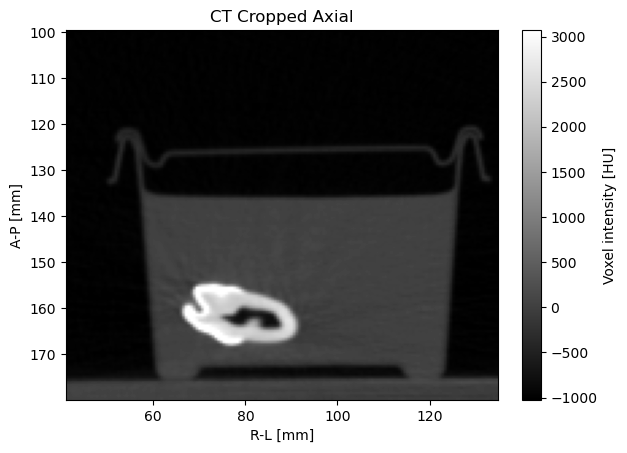

In [6]:
# Crop and display a CT axial slice - choose the slice by changing the index below
axial = ct_img3d[:, :, 546]

y_min = 170
y_max = 307

#x scale move to the right box
# x_min = 320
# x_max = 470

x_min = 70
x_max = 230

cropped_axial = axial[y_min:y_max, x_min:x_max]

plt.figure()
im = plt.imshow(cropped_axial, cmap=colormap, extent=[x_min*ct_voxel[1], x_max*ct_voxel[1], y_max*ct_voxel[0], y_min*ct_voxel[0]])
plt.title(f'CT Cropped Axial')
plt.xlabel('R-L [mm]')
plt.ylabel('A-P [mm]')
plt.colorbar(im, fraction=0.05, pad=0.05, label="Voxel intensity [HU]")
print("Cropped axial shape:", cropped_axial.shape)
print("Cropped axial intensity range:", np.min(cropped_axial), np.max(cropped_axial))
print("Cropped axial type:", cropped_axial.dtype)

Normalized cropped axial intensity range: 0 255
Normalized cropped axial type: uint8
Minimum pixel value: 11
Maximum pixel value: 255


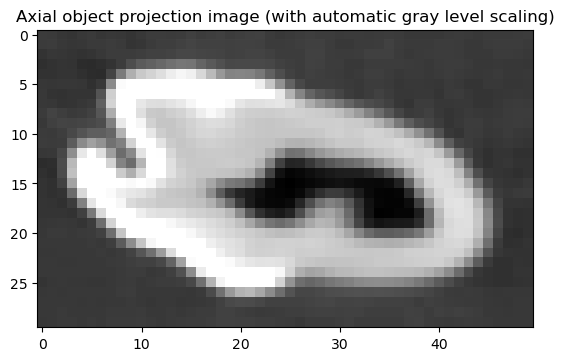

In [7]:
# Source - https://stackoverflow.com/a
# Posted by John_Sharp1318, modified by community. See post 'Timeline' for change history
# Retrieved 2025-11-21, License - CC BY-SA 4.0

def normalize8(I):
  mn = I.min()
  mx = I.max()

  mx -= mn

  I = ((I - mn)/mx) * 255
  return I.astype(np.uint8)
normalized_cropped_axial = normalize8(cropped_axial)
print("Normalized cropped axial intensity range:", np.min(normalized_cropped_axial), np.max(normalized_cropped_axial))
print("Normalized cropped axial type:", normalized_cropped_axial.dtype)

list2 = []
for value in normalized_cropped_axial[90:120, 40:90,]:
    list2.append(value)

min_pixel = np.min(list2)
max_pixel = np.max(list2)
print("Minimum pixel value:", min_pixel)
print("Maximum pixel value:", max_pixel)

plt.imshow(normalized_cropped_axial[90:120, 40:90], vmin=min_pixel, vmax=max_pixel, cmap='gray')
plt.title('Axial object projection image (with automatic gray level scaling)')
plt.show()

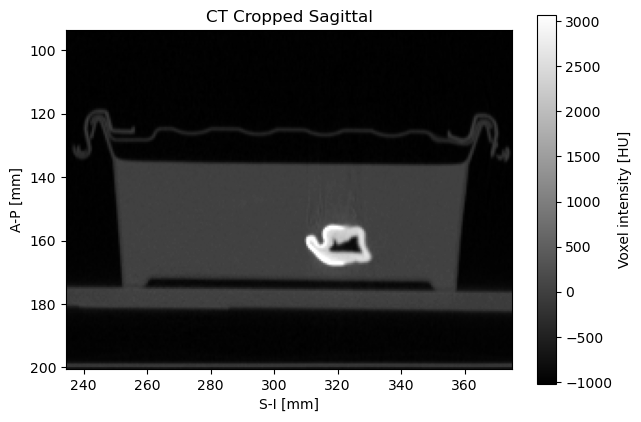

In [8]:
# Crop and display a CT sagittal slice - choose the slice by changing the index below
sagittal = ct_img3d[:, 132, :]

y_min = 160
y_max = 342

#x scale move to the right box
x_min = 400
x_max = 640

cropped_sagittal = sagittal[y_min:y_max, x_min:x_max]

plt.figure()
im = plt.imshow(cropped_sagittal, cmap=colormap, extent=[x_min*ct_voxel[1], x_max*ct_voxel[1], y_max*ct_voxel[0], y_min*ct_voxel[0]])
plt.title(f'CT Cropped Sagittal')
plt.xlabel('S-I [mm]')
plt.ylabel('A-P [mm]')
plt.colorbar(im, fraction=0.05, pad=0.05, label="Voxel intensity [HU]")

Normalized cropped sagittal intensity range: 0 255
Normalized cropped sagittal type: uint8
Cropped sagittal shape: (182, 240)
Minimum pixel value: 8
Maximum pixel value: 255


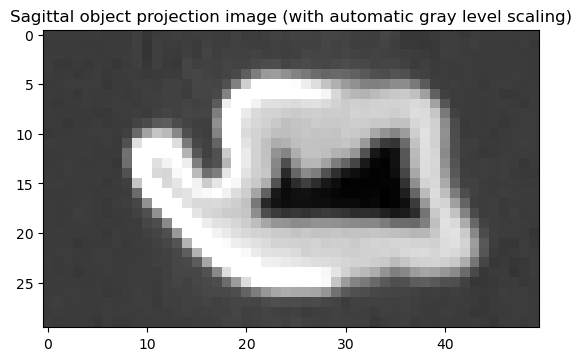

In [9]:
normalized_cropped_sagittal = normalize8(cropped_sagittal)
print("Normalized cropped sagittal intensity range:", np.min(normalized_cropped_sagittal), np.max(normalized_cropped_sagittal))
print("Normalized cropped sagittal type:", normalized_cropped_sagittal.dtype)
print("Cropped sagittal shape:", cropped_sagittal.shape)
list = []
for value in normalized_cropped_sagittal[100:130,120:170]:
    list.append(value)

min_pixel = np.min(list)
max_pixel = np.max(list)
print("Minimum pixel value:", min_pixel)
print("Maximum pixel value:", max_pixel)

plt.imshow(normalized_cropped_sagittal[100:130, 120:170], vmin=min_pixel, vmax=max_pixel, cmap='gray')
plt.title('Sagittal object projection image (with automatic gray level scaling)')
plt.show()

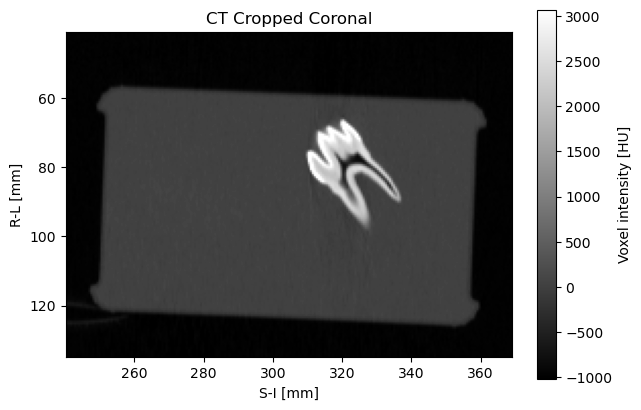

In [14]:
# Crop and display a CT coronal slice - choose the slice by changing the index below
coronal = ct_img3d[274, :, :]

y_min = 70
y_max = 230

# y_min = 320
# y_max = 470

#x scale move to the right box
x_min = 410
x_max = 630

cropped_coronal = coronal[ y_min:y_max, x_min:x_max]

plt.figure()
im = plt.imshow(cropped_coronal, cmap=colormap, extent=[x_min*ct_voxel[1], x_max*ct_voxel[1], y_max*ct_voxel[0], y_min*ct_voxel[0]])
plt.title(f'CT Cropped Coronal')
plt.xlabel('S-I [mm]')
plt.ylabel('R-L [mm]')
plt.colorbar(im, fraction=0.05, pad=0.05, label="Voxel intensity [HU]")

Normalized cropped coronal intensity range: 0 255
Normalized cropped coronal type: uint8
Cropped coronal shape: (160, 220)
Minimum pixel value: 8
Maximum pixel value: 255


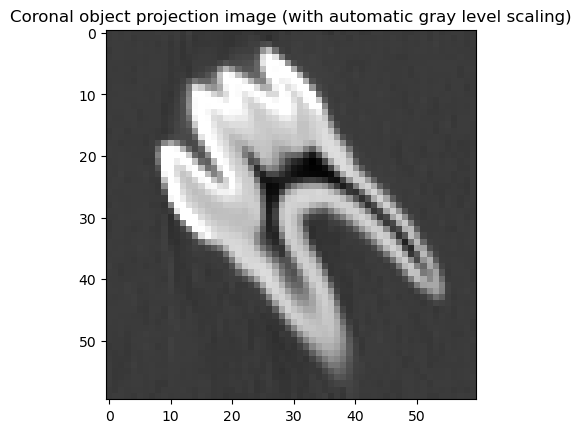

In [15]:
normalized_cropped_coronal = normalize8(cropped_coronal)
print("Normalized cropped coronal intensity range:", np.min(normalized_cropped_coronal), np.max(normalized_cropped_coronal))
print("Normalized cropped coronal type:", normalized_cropped_coronal.dtype)
print("Cropped coronal shape:", cropped_coronal.shape)
list = []
for value in normalized_cropped_coronal[40:100,110:170]:
    list.append(value)

min_pixel = np.min(list)
max_pixel = np.max(list)
print("Minimum pixel value:", min_pixel)
print("Maximum pixel value:", max_pixel)

plt.imshow(normalized_cropped_coronal[40:100, 110:170], vmin=min_pixel, vmax=max_pixel, cmap='gray')
plt.title('Coronal object projection image (with automatic gray level scaling)')
plt.show()

# Slices #

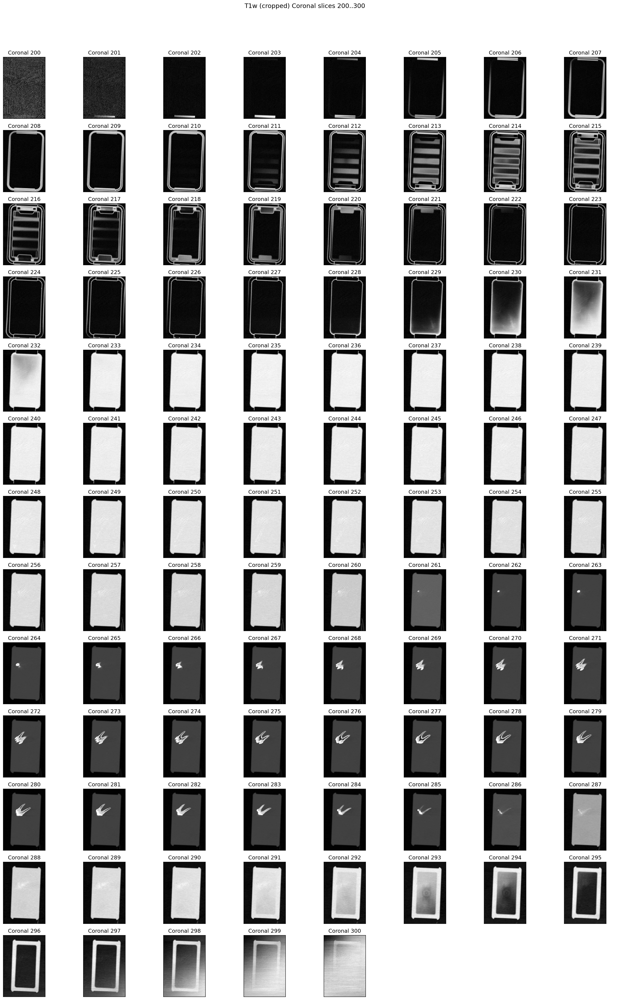

In [43]:
import math
import numpy as np

# Plot coronal slices 30 through 88 from the T1-weighted cropped region
import matplotlib.pyplot as plt

# Desired coronal slice indices (within the cropped volume)
slice_start = 200
slice_end = 300  # inclusive

# Use existing crop limits (defined earlier in the notebook)
# If these variables are not present, adjust them accordingly.
# try:
#     AP_mm, RL_mm, SI_mm
# except NameError:
#     AP_mm = (35, 85)
#     RL_mm = (20, 150)
#     SI_mm = (150, 230)

# # Compute voxel crop ranges for T1w
# AP_vox = np.rint(np.array(cropped_coronal).astype(int)
# RL_vox = np.rint(np.array(cropped_coronal).astype(int)
# SI_vox = np.rint(np.array(cropped_coronal).astype(int)
y_min = 70
y_max = 230

# y_min = 320
# y_max = 470

#x scale move to the right box
x_min = 410
x_max = 630

# cropped = t1w_img3d[AP_vox[0]:AP_vox[1], RL_vox[0]:RL_vox[1], SI_vox[0]:SI_vox[1]]
slices_cropped_coronal = ct_img3d[:, y_min:y_max, x_min:x_max]
AP_dim, RL_dim, SI_dim = slices_cropped_coronal.shape
ap_size, rl_size, si_size = ct_voxel  # assuming same voxel size for cropped

# Clip requested range to available coronal slices
slice_start = max(0, slice_start)
slice_end = min(AP_dim - 1, slice_end)
if slice_start > slice_end:
    raise ValueError(f"Requested slice range {slice_start}-{slice_end} is outside cropped coronal range 0-{AP_dim-1}.")

n_plots = slice_end - slice_start + 1
cols = min(8, n_plots)
rows = math.ceil(n_plots / cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5), dpi=150)
axes = np.atleast_2d(axes)
fig.suptitle(f"T1w (cropped) Coronal slices {slice_start}..{slice_end}", fontsize=14)

for i in range(n_plots):
    row, col = divmod(i, cols)
    ax = axes[row, col]
    sidx = slice_start + i
    img = np.rot90(slices_cropped_coronal[sidx, :, :])
    extent = [0, RL_dim * rl_size, SI_dim * si_size, 0]
    ax.imshow(img, cmap='gray', extent=extent)
    ax.set_title(f"Coronal {sidx}")
    ax.set_xticks([])
    ax.set_yticks([])

# Turn off any unused axes
for j in range(n_plots, rows * cols):
    r, c = divmod(j, cols)
    axes[r, c].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

INTENSITY PROFILE

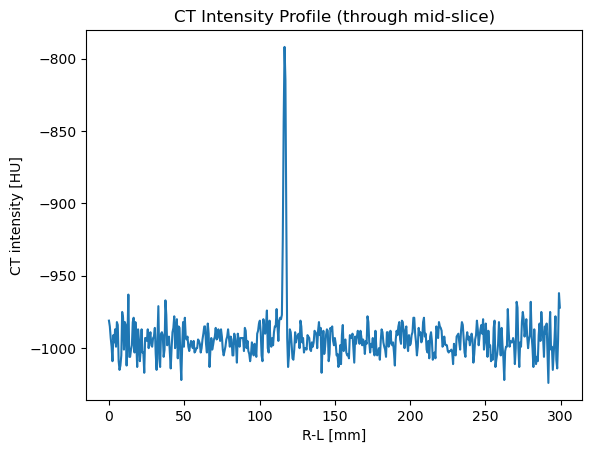

In [ ]:
profile = ct_img3d[ct_img3d.shape[0] // 2, :, ct_img3d.shape[2] // 2]

x_mm = np.arange(len(profile)) * ct_voxel[1]
plt.figure()
plt.plot(x_mm, profile)
plt.xlabel("R-L [mm]")
plt.ylabel("CT intensity [HU]") # HU = Hounsfield Units
plt.title("CT Intensity Profile (through mid-slice)")
plt.show()



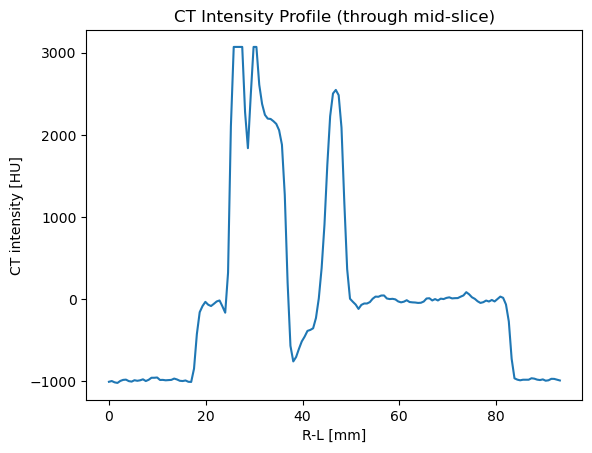

In [ ]:
cropped_image3D = ct_img3d[160:342, 70:230, 400:640]

profile_RL = cropped_image3D[274-160, :, 546-400]

x_mm = np.arange(len(profile_RL)) * ct_voxel[1]
plt.figure()
plt.plot(x_mm, profile_RL)
plt.xlabel("R-L [mm]")
plt.ylabel("CT intensity [HU]") # HU = Hounsfield Units
plt.title("CT Intensity Profile (through mid-slice)")
plt.show()

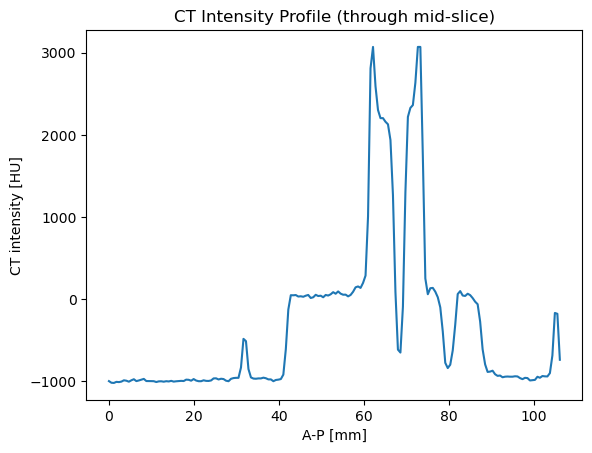

In [ ]:
profile_AP = cropped_image3D[:,132-70, 546-400]

x_mm = np.arange(len(profile_AP)) * ct_voxel[0]
plt.figure()
plt.plot(x_mm, profile_AP)
plt.xlabel("A-P [mm]")
plt.ylabel("CT intensity [HU]") # HU = Hounsfield Units
plt.title("CT Intensity Profile (through mid-slice)")
plt.show()

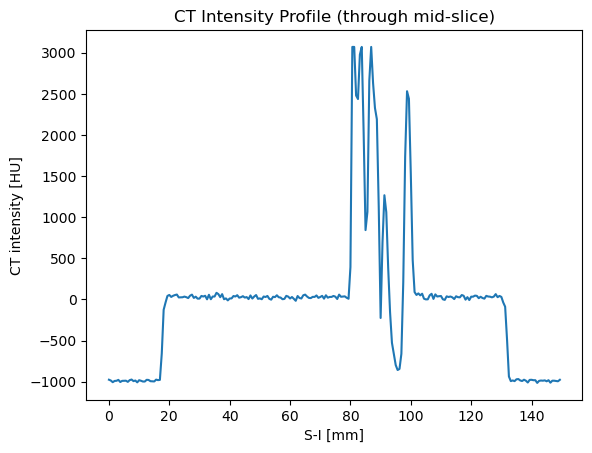

In [ ]:
profile_SI = cropped_image3D[274-160, 132-70, :]

x_mm = np.arange(len(profile_SI)) * ct_voxel[2]
plt.figure()
plt.plot(x_mm, profile_SI)
plt.xlabel("S-I [mm]")
plt.ylabel("CT intensity [HU]") # HU = Hounsfield Units
plt.title("CT Intensity Profile (through mid-slice)")
plt.show()

FINDING OTHER OBJECTS:

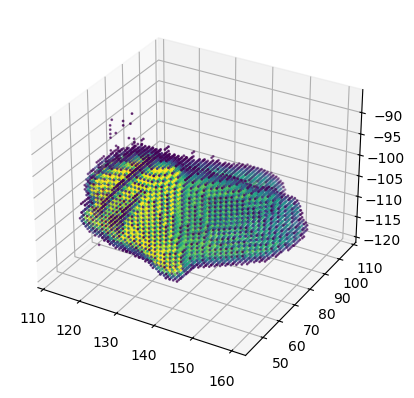

Text(0.10787434422876366, 0.01445242171006698, '-(A-P)')

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

cropped_image3D = ct_img3d[170:307, 68:221, 416:624]
z, y, x = np.nonzero(cropped_image3D > 200)   # pick threshold -300 for the box, 1000 for the bone
vals = cropped_image3D[z, y, x]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, -z, c=vals, cmap='viridis', s=1)
plt.show()
ax.set_xlabel("S-I")
ax.set_ylabel("R-L")
ax.set_zlabel("-(A-P)")


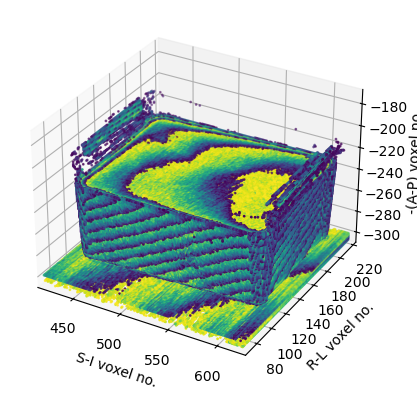

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

cropped_image3D = ct_img3d[170:307, 68:221, 416:624]

# threshold
z, y, x = np.nonzero((cropped_image3D > -200) & (cropped_image3D < 0)) # pick threshold limit 200 # 1000 for bone #-300 for everything except air
# >-300 to get rid of air
# 
vals = cropped_image3D[z, y, x]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = x + 416
y = (y + 68)
z = -(z + 170)
# scatter points
ax.scatter(x, y, z, c=vals, cmap='viridis', s=1)


ax.set_autoscale_on(False)
# ---- key addition ----
ax.set_xlim3d(416,624) #(0, cropped_image3D.shape[2])
ax.set_ylim3d(68,221) #(0, cropped_image3D.shape[1])
ax.set_zlim3d(-307,-170) #(0, cropped_image3D.shape[0])

ax.set_xlabel("S-I voxel no.")
ax.set_ylabel("R-L voxel no.")
ax.set_zlabel("-(A-P) voxel no.")

plt.show()


In [ ]:
# Get the min/max ranges along each axis
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
z_min, z_max = z.min(), z.max()

print("S-I range:", x_min, "to", x_max)
print("R-L range:", y_min, "to", y_max)
print("A-P range:", -z_max, "to", -z_min)

S-I range: 416 to 623
R-L range: 68 to 220
A-P range: 203 to 306


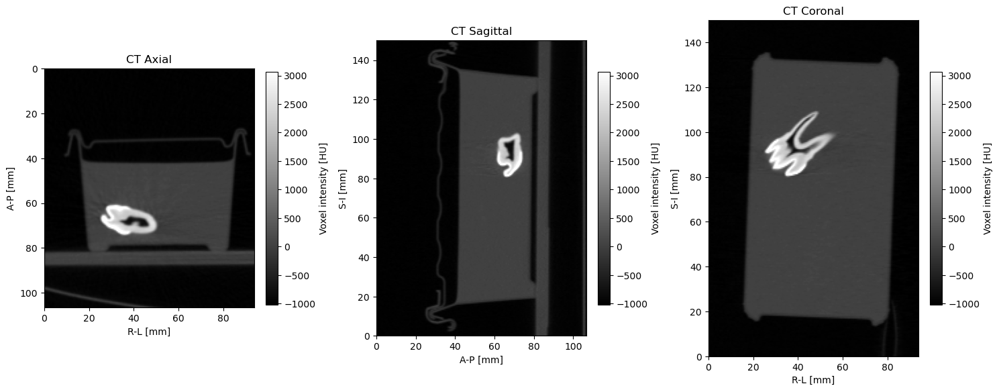

In [ ]:
# Show CT 
cropped_image3D = ct_img3d[160:342, 70:230, 400:640]
loc_ct = [274-160,132-70,546-400]
show_slices(cropped_image3D, ct_voxel, loc_ct, colormap, title_prefix="CT", voxel_units="Voxel intensity [HU]")

# Gaussian filtering #

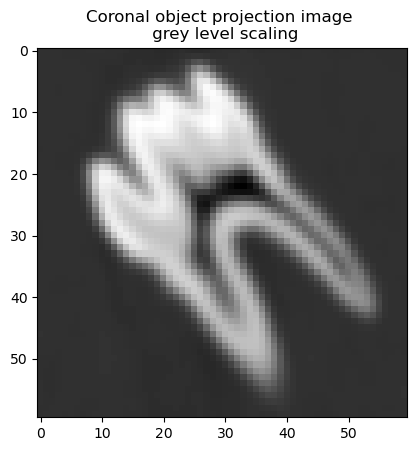

In [ ]:
filtered_coronal = filters.gaussian(normalized_cropped_coronal[40:100, 110:170], sigma=1)
plt.imshow(filtered_coronal, cmap='gray')
plt.title('Coronal object projection image \n grey level scaling')
plt.show()

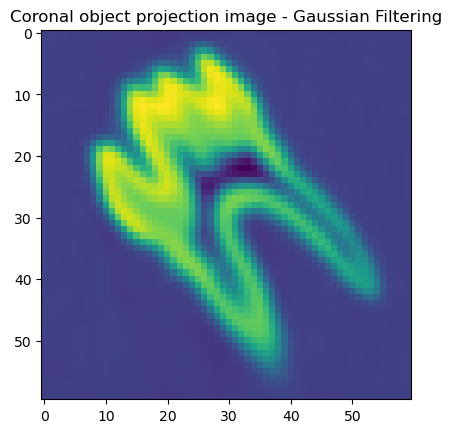

In [ ]:
filtered_coronal = gaussian_filter(normalized_cropped_coronal[40:100, 110:170], 1, order=0, output=None, mode='reflect', cval=0.0, truncate=4.0, radius=None, axes=None)
plt.imshow(filtered_coronal)
plt.title('Coronal object projection image - Gaussian Filtering')
plt.show()

# EDGES #

Text(0.5, 1.0, 'Coronal object projection image - Canny edges \n(sigma=0.5)')

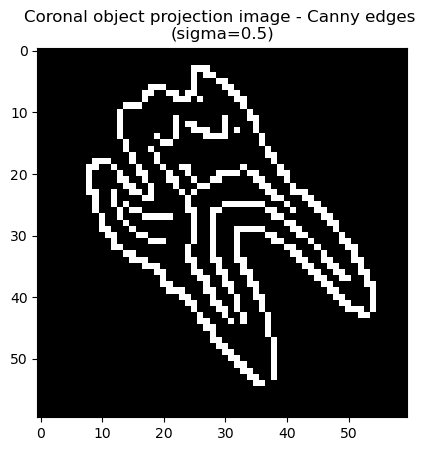

In [ ]:
#print(ct_img3d_clipped)

#normalizing to values between 0 and 1:
p = (filtered_coronal - np.min(filtered_coronal)) / (np.max(filtered_coronal) - np.min(filtered_coronal))
#print(p)
# NB! loc is given in matrix size / grid units, whereas images are shown with axes in units of mm
# loc_AP = loc[0]
# loc_RL = loc[1]
# loc_SI = loc[2]
# axial = p[:, :, loc_SI]
ct_edges_canny = feature.canny(p, sigma=0.5)
plt.figure()
im = plt.imshow(ct_edges_canny, cmap=colormap)
plt.title(f'Coronal object projection image - Canny edges \n(sigma=0.5)')
#plt.colorbar(im, fraction=0.05, pad=0.05, label="Voxel intensity [a.u.]")

# Interpolation #

(60, 60)


Text(0.5, 1.0, 'Coronal object projection image - resized')

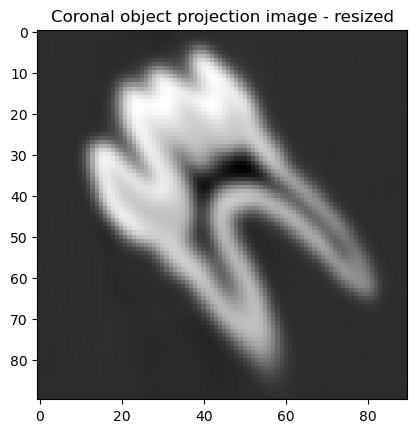

In [ ]:
print (filtered_coronal.shape)
resized_coronal = resize(filtered_coronal, (90, 90))
im = plt.imshow(resized_coronal, cmap = colormap)
plt.title (f'Coronal object projection image - resized')

# Maximum Intensity Projection # 

# Understanding np.max with Different Axes

Original filtered_coronal shape: (60, 60)
Original intensity range: 21 to 249

axis=0 - Max along rows:
Output shape: (60,)
Output range: 65 to 249

axis=1 - Max along columns:
Output shape: (60,)
Output range: 65 to 249

axis=None - Max of entire image:
Output: 249


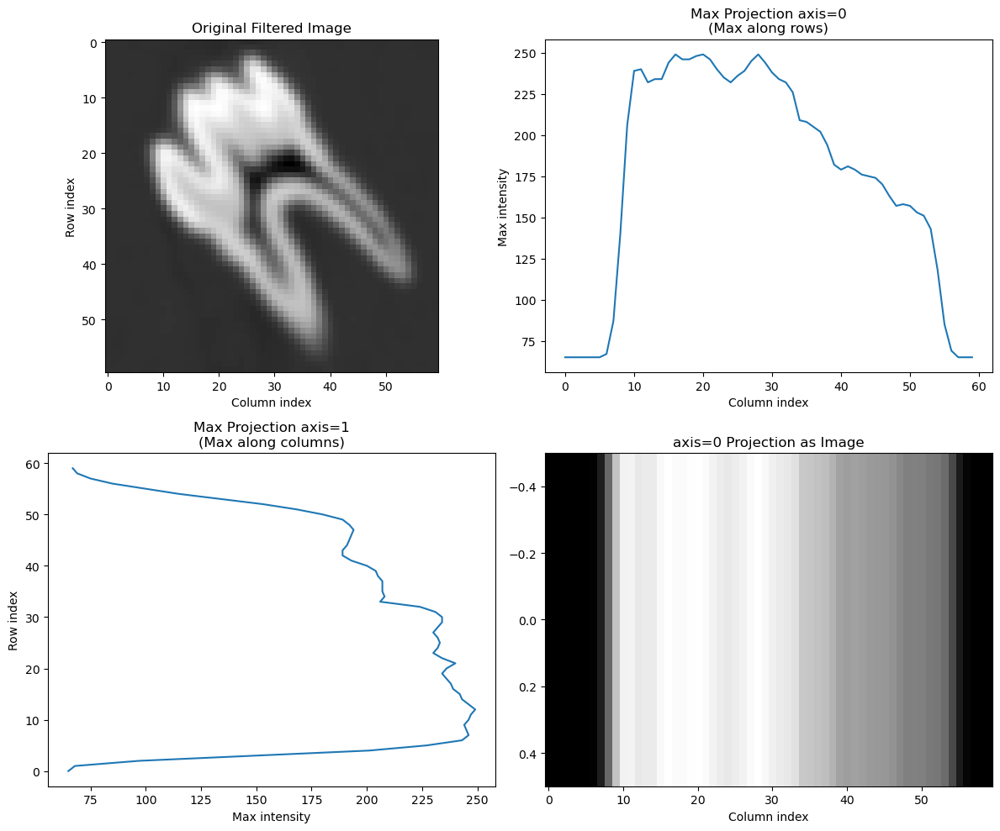

In [ ]:
# Demonstrate np.max with different axes on your filtered image
print("Original filtered_coronal shape:", filtered_coronal.shape)
print("Original intensity range:", np.min(filtered_coronal), "to", np.max(filtered_coronal))

# Maximum along axis=0 (collapse rows, keep columns)
mip_axis0 = np.max(filtered_coronal, axis=0)
print("\naxis=0 - Max along rows:")
print("Output shape:", mip_axis0.shape)
print("Output range:", np.min(mip_axis0), "to", np.max(mip_axis0))

# Maximum along axis=1 (collapse columns, keep rows) 
mip_axis1 = np.max(filtered_coronal, axis=1)
print("\naxis=1 - Max along columns:")
print("Output shape:", mip_axis1.shape)
print("Output range:", np.min(mip_axis1), "to", np.max(mip_axis1))

# Maximum of entire image (single value)
max_overall = np.max(filtered_coronal)
print("\naxis=None - Max of entire image:")
print("Output:", max_overall)

# Visualize the projections
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Original image
axes[0,0].imshow(filtered_coronal, cmap='gray')
axes[0,0].set_title('Original Filtered Image')
axes[0,0].set_xlabel('Column index')
axes[0,0].set_ylabel('Row index')

# axis=0 projection (horizontal line plot)
axes[0,1].plot(mip_axis0)
axes[0,1].set_title('Max Projection axis=0\n(Max along rows)')
axes[0,1].set_xlabel('Column index')
axes[0,1].set_ylabel('Max intensity')

# axis=1 projection (vertical line plot)
axes[1,0].plot(mip_axis1, range(len(mip_axis1)))
axes[1,0].set_title('Max Projection axis=1\n(Max along columns)')
axes[1,0].set_xlabel('Max intensity')
axes[1,0].set_ylabel('Row index')

# Show axis=0 projection as image (1D array reshaped)
axes[1,1].imshow(mip_axis0.reshape(1, -1), cmap='gray', aspect='auto')
axes[1,1].set_title('axis=0 Projection as Image')
axes[1,1].set_xlabel('Column index')

plt.tight_layout()
plt.show()

# IMPORTANT: np.max finds MAXIMUM values, not minimum!

Original 2D array:
[[1 5 2]
 [8 3 6]
 [4 9 7]]
Shape: (3, 3)

--- Using np.max along different axes ---

np.max(array, axis=0) - maximum along rows:
For each COLUMN, find the maximum value across all rows
Result: [8 9 7]
Shape: (3,)
Explanation: [max(1,8,4), max(5,3,9), max(2,6,7)] = [8, 9, 7]

np.max(array, axis=1) - maximum along columns:
For each ROW, find the maximum value across all columns
Result: [5 8 9]
Shape: (3,)
Explanation: [max(1,5,2), max(8,3,6), max(4,9,7)] = [5, 8, 9]

--- Compare with np.min (finds MINIMUM values) ---
np.min(array, axis=0): [1 3 2] ← minimum values
np.max(array, axis=0): [8 9 7] ← maximum values

See the difference? np.max finds the HIGHEST values!


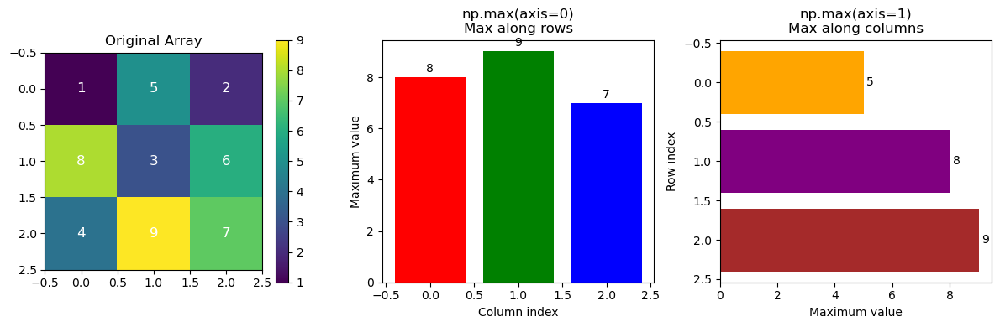

In [ ]:
# Let's create a simple example to show what np.max does
# Create a simple 3x3 array with known values
test_array = np.array([[1, 5, 2],
                       [8, 3, 6], 
                       [4, 9, 7]])

print("Original 2D array:")
print(test_array)
print("Shape:", test_array.shape)

print("\n--- Using np.max along different axes ---")

# axis=0: maximum along rows (collapse rows, keep columns)
max_axis0 = np.max(test_array, axis=0)
print("\nnp.max(array, axis=0) - maximum along rows:")
print("For each COLUMN, find the maximum value across all rows")
print("Result:", max_axis0)
print("Shape:", max_axis0.shape)
print("Explanation: [max(1,8,4), max(5,3,9), max(2,6,7)] = [8, 9, 7]")

# axis=1: maximum along columns (collapse columns, keep rows)  
max_axis1 = np.max(test_array, axis=1)
print("\nnp.max(array, axis=1) - maximum along columns:")
print("For each ROW, find the maximum value across all columns")
print("Result:", max_axis1)
print("Shape:", max_axis1.shape)
print("Explanation: [max(1,5,2), max(8,3,6), max(4,9,7)] = [5, 8, 9]")

# Compare with np.min to show the difference
min_axis0 = np.min(test_array, axis=0)
min_axis1 = np.min(test_array, axis=1)
print("\n--- Compare with np.min (finds MINIMUM values) ---")
print("np.min(array, axis=0):", min_axis0, "← minimum values")
print("np.max(array, axis=0):", max_axis0, "← maximum values")
print("\nSee the difference? np.max finds the HIGHEST values!")

# Visualize the difference
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original array
im1 = axes[0].imshow(test_array, cmap='viridis')
axes[0].set_title('Original Array')
axes[0].text(0, 0, '1', ha='center', va='center', color='white', fontsize=12)
axes[0].text(1, 0, '5', ha='center', va='center', color='white', fontsize=12)
axes[0].text(2, 0, '2', ha='center', va='center', color='white', fontsize=12)
axes[0].text(0, 1, '8', ha='center', va='center', color='white', fontsize=12)
axes[0].text(1, 1, '3', ha='center', va='center', color='white', fontsize=12)
axes[0].text(2, 1, '6', ha='center', va='center', color='white', fontsize=12)
axes[0].text(0, 2, '4', ha='center', va='center', color='white', fontsize=12)
axes[0].text(1, 2, '9', ha='center', va='center', color='white', fontsize=12)
axes[0].text(2, 2, '7', ha='center', va='center', color='white', fontsize=12)
plt.colorbar(im1, ax=axes[0])

# Max along axis=0 (shown as horizontal bar)
axes[1].bar(range(3), max_axis0, color=['red', 'green', 'blue'])
axes[1].set_title('np.max(axis=0)\nMax along rows')
axes[1].set_xlabel('Column index')
axes[1].set_ylabel('Maximum value')
for i, v in enumerate(max_axis0):
    axes[1].text(i, v + 0.1, str(v), ha='center', va='bottom')

# Max along axis=1 (shown as vertical bar)
axes[2].barh(range(3), max_axis1, color=['orange', 'purple', 'brown'])
axes[2].set_title('np.max(axis=1)\nMax along columns')
axes[2].set_ylabel('Row index')
axes[2].set_xlabel('Maximum value')
axes[2].invert_yaxis()  # To match array orientation
for i, v in enumerate(max_axis1):
    axes[2].text(v + 0.1, i, str(v), ha='left', va='center')

plt.tight_layout()
plt.show()

# Maximum Intensity Projection (MIP) for 3D Medical Images

3D volume shape: (137, 160, 208)
3D volume range: -1024.0 to 3071.0

MIP shapes:
Axial MIP (axis=2): (137, 160)
Sagittal MIP (axis=1): (137, 208)
Coronal MIP (axis=0): (160, 208)


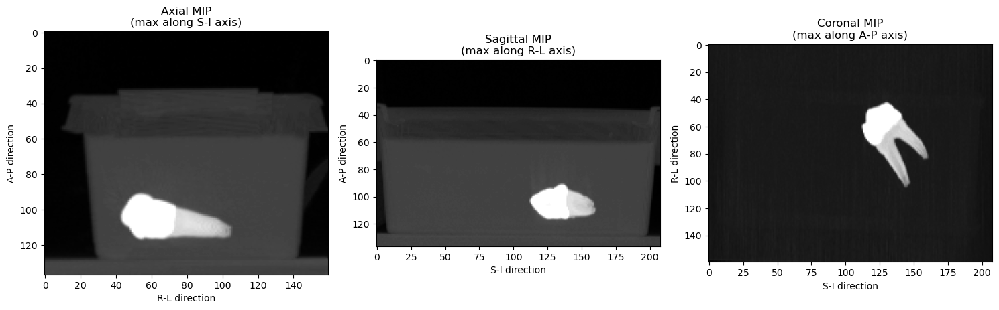


MIP intensity ranges:
Axial MIP: -978.0 to 3071.0
Sagittal MIP: -983.0 to 3071.0
Coronal MIP: -257.0 to 3071.0


In [ ]:
# Create MIP projections from your 3D CT data
# Using the cropped 3D volume for better visualization

cropped_3d = ct_img3d[170:307, 70:230, 416:624]
print("3D volume shape:", cropped_3d.shape)
print("3D volume range:", np.min(cropped_3d), "to", np.max(cropped_3d))

# Create MIP along each axis
mip_axial = np.max(cropped_3d, axis=2)      # Project along S-I axis → Axial view
mip_sagittal = np.max(cropped_3d, axis=1)   # Project along R-L axis → Sagittal view  
mip_coronal = np.max(cropped_3d, axis=0)    # Project along A-P axis → Coronal view

print(f"\nMIP shapes:")
print(f"Axial MIP (axis=2): {mip_axial.shape}")
print(f"Sagittal MIP (axis=1): {mip_sagittal.shape}")
print(f"Coronal MIP (axis=0): {mip_coronal.shape}")

# Display the MIP projections
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Axial MIP (looking down from top)
im1 = axes[0].imshow(mip_axial, cmap='gray')
axes[0].set_title('Axial MIP\n(max along S-I axis)')
axes[0].set_xlabel('R-L direction')
axes[0].set_ylabel('A-P direction')

# Sagittal MIP (looking from the side)
im2 = axes[1].imshow(mip_sagittal, cmap='gray')
axes[1].set_title('Sagittal MIP\n(max along R-L axis)')
axes[1].set_xlabel('S-I direction') 
axes[1].set_ylabel('A-P direction')

# Coronal MIP (looking from front/back)
im3 = axes[2].imshow(mip_coronal, cmap='gray')
axes[2].set_title('Coronal MIP\n(max along A-P axis)')
axes[2].set_xlabel('S-I direction')
axes[2].set_ylabel('R-L direction')

plt.tight_layout()
plt.show()

# Show intensity ranges for each MIP
print(f"\nMIP intensity ranges:")
print(f"Axial MIP: {np.min(mip_axial):.1f} to {np.max(mip_axial):.1f}")
print(f"Sagittal MIP: {np.min(mip_sagittal):.1f} to {np.max(mip_sagittal):.1f}")
print(f"Coronal MIP: {np.min(mip_coronal):.1f} to {np.max(mip_coronal):.1f}")

# Histogram equalization / Contrast enhancement #

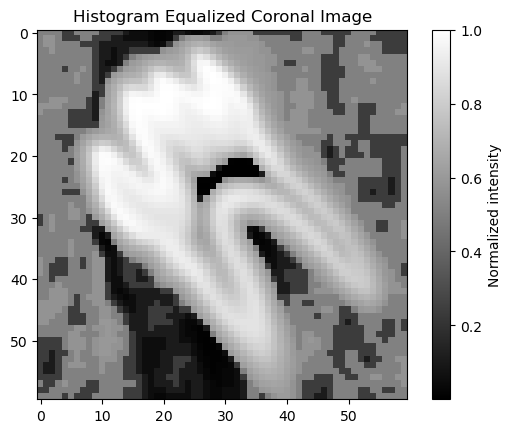

In [ ]:
hist_coronal = exposure.equalize_hist(filtered_coronal, nbins=256, mask=None)
im = plt.imshow(hist_coronal, cmap=colormap)
plt.title('Histogram Equalized Coronal Image')
plt.colorbar(im, fraction=0.05, pad=0.05, label="Normalized intensity")
plt.show()

# Understanding Histogram Equalization and Contrast Enhancement

Original image stats:
Shape: (60, 60)
Min/Max: 21.000 / 249.000
Mean: 97.916
Std: 54.788


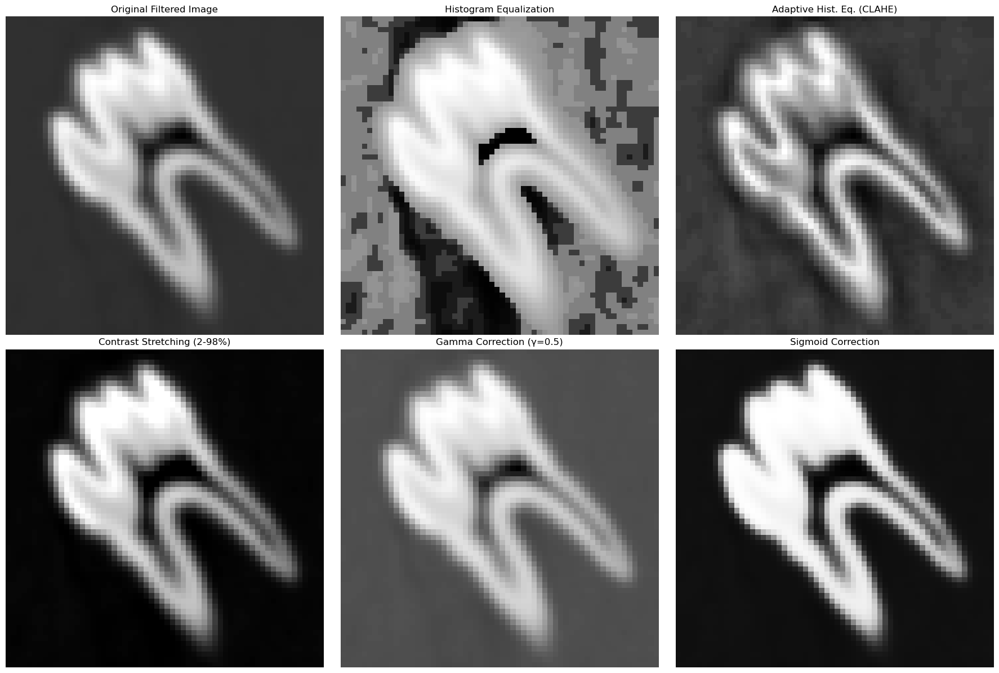


Comparison of enhancement methods:
Method               Min      Max      Mean     Std     
------------------------------------------------------------
Original             21.000   249.000  97.916   54.788  
Histogram Eq.        0.000    1.000    0.549    0.262   
Adaptive Hist. Eq.   0.000    1.000    0.344    0.224   
Contrast Stretch     0.000    255.000  55.011   79.670  
Gamma Correction     73.000   252.000  153.124  39.467  
Sigmoid              3.000    252.000  73.223   86.501  


In [ ]:
# Compare different contrast enhancement methods
print("Original image stats:")
print(f"Shape: {filtered_coronal.shape}")
print(f"Min/Max: {np.min(filtered_coronal):.3f} / {np.max(filtered_coronal):.3f}")
print(f"Mean: {np.mean(filtered_coronal):.3f}")
print(f"Std: {np.std(filtered_coronal):.3f}")

# 1. Histogram Equalization - redistributes intensities for better contrast
hist_eq = exposure.equalize_hist(filtered_coronal, nbins=256)

# 2. Adaptive Histogram Equalization (CLAHE) - local contrast enhancement
hist_adaptive = exposure.equalize_adapthist(filtered_coronal, kernel_size=None, clip_limit=0.03, nbins=256)

# 3. Contrast Stretching - linear scaling to use full range
p2, p98 = np.percentile(filtered_coronal, (2, 98))  # Remove outliers
contrast_stretch = exposure.rescale_intensity(filtered_coronal, in_range=(p2, p98))

# 4. Gamma Correction - nonlinear brightness adjustment
gamma_corrected = exposure.adjust_gamma(filtered_coronal, gamma=0.5)  # gamma < 1 brightens

# 5. Sigmoid Correction - S-shaped curve for smooth contrast
sigmoid = exposure.adjust_sigmoid(filtered_coronal, cutoff=0.5, gain=10)

# Display all methods for comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Original
axes[0,0].imshow(filtered_coronal, cmap='gray')
axes[0,0].set_title('Original Filtered Image')
axes[0,0].axis('off')

# Histogram Equalization
axes[0,1].imshow(hist_eq, cmap='gray')
axes[0,1].set_title('Histogram Equalization')
axes[0,1].axis('off')

# Adaptive Histogram Equalization (CLAHE)
axes[0,2].imshow(hist_adaptive, cmap='gray')
axes[0,2].set_title('Adaptive Hist. Eq. (CLAHE)')
axes[0,2].axis('off')

# Contrast Stretching
axes[1,0].imshow(contrast_stretch, cmap='gray')
axes[1,0].set_title('Contrast Stretching (2-98%)')
axes[1,0].axis('off')

# Gamma Correction
axes[1,1].imshow(gamma_corrected, cmap='gray')
axes[1,1].set_title('Gamma Correction (γ=0.5)')
axes[1,1].axis('off')

# Sigmoid Correction
axes[1,2].imshow(sigmoid, cmap='gray')
axes[1,2].set_title('Sigmoid Correction')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()

# Print statistics for comparison
methods = [
    ("Original", filtered_coronal),
    ("Histogram Eq.", hist_eq),
    ("Adaptive Hist. Eq.", hist_adaptive),
    ("Contrast Stretch", contrast_stretch),
    ("Gamma Correction", gamma_corrected),
    ("Sigmoid", sigmoid)
]

print("\nComparison of enhancement methods:")
print("Method".ljust(20), "Min".ljust(8), "Max".ljust(8), "Mean".ljust(8), "Std".ljust(8))
print("-" * 60)
for name, img in methods:
    print(f"{name:<20} {np.min(img):<8.3f} {np.max(img):<8.3f} {np.mean(img):<8.3f} {np.std(img):<8.3f}")

# Histogram Analysis - Visualizing the Effects

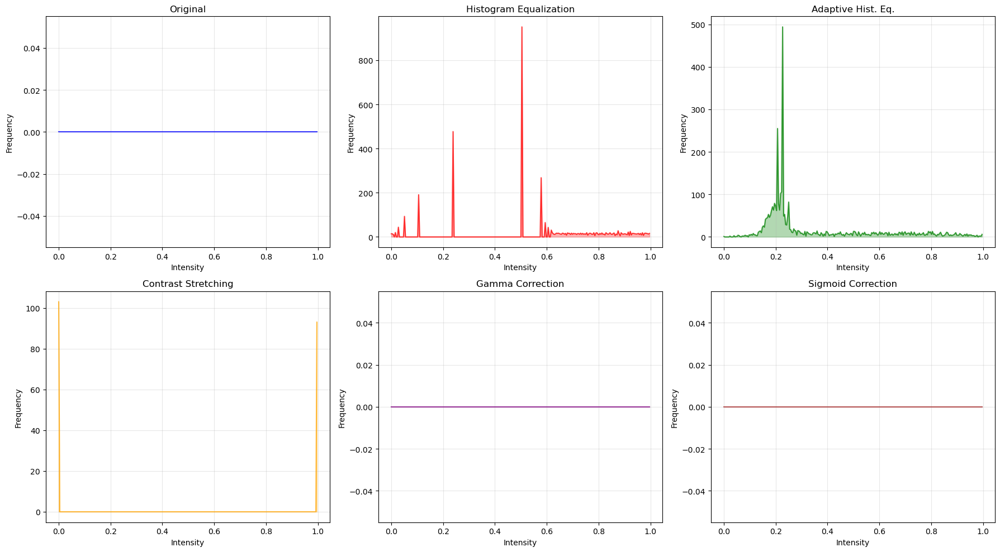

Histogram Analysis:
- Original: Shows the natural distribution of intensities
- Histogram Eq.: Flattens the distribution, spreading intensities evenly
- Adaptive Hist. Eq.: Similar to histogram eq. but preserves local details
- Contrast Stretching: Stretches the existing distribution to full range
- Gamma Correction: Shifts distribution toward brighter values (γ<1)
- Sigmoid: Creates smooth S-shaped intensity mapping


In [35]:
# Plot histograms to see how each method redistributes intensities
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Helper function to plot histogram
def plot_histogram(ax, image, title, color='blue'):
    hist, bins = np.histogram(image.flatten(), bins=256, range=(0, 1))
    ax.plot(bins[:-1], hist, color=color, alpha=0.7)
    ax.fill_between(bins[:-1], hist, alpha=0.3, color=color)
    ax.set_title(title)
    ax.set_xlabel('Intensity')
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)

# Plot histograms for each method
plot_histogram(axes[0,0], filtered_coronal, 'Original', 'blue')
plot_histogram(axes[0,1], hist_eq, 'Histogram Equalization', 'red')
plot_histogram(axes[0,2], hist_adaptive, 'Adaptive Hist. Eq.', 'green')
plot_histogram(axes[1,0], contrast_stretch, 'Contrast Stretching', 'orange')
plot_histogram(axes[1,1], gamma_corrected, 'Gamma Correction', 'purple')
plot_histogram(axes[1,2], sigmoid, 'Sigmoid Correction', 'brown')

plt.tight_layout()
plt.show()

print("Histogram Analysis:")
print("- Original: Shows the natural distribution of intensities")
print("- Histogram Eq.: Flattens the distribution, spreading intensities evenly")
print("- Adaptive Hist. Eq.: Similar to histogram eq. but preserves local details")
print("- Contrast Stretching: Stretches the existing distribution to full range")
print("- Gamma Correction: Shifts distribution toward brighter values (γ<1)")
print("- Sigmoid: Creates smooth S-shaped intensity mapping")

# Medical Imaging Applications

In [36]:
# Apply different enhancement methods to your CT data for medical analysis
# Let's work with a full slice for better demonstration

# Take a full coronal slice from your CT data
full_coronal_slice = ct_img3d[274, :, :]  # Use the same slice you used before
print("Full coronal slice shape:", full_coronal_slice.shape)
print("Full coronal slice range (HU):", np.min(full_coronal_slice), "to", np.max(full_coronal_slice))

# Normalize to 0-1 for enhancement algorithms
normalized_full = (full_coronal_slice - np.min(full_coronal_slice)) / (np.max(full_coronal_slice) - np.min(full_coronal_slice))

# Apply different enhancement methods
methods_full = {
    'Original': normalized_full,
    'Histogram Eq.': exposure.equalize_hist(normalized_full),
    'CLAHE': exposure.equalize_adapthist(normalized_full, clip_limit=0.02),
    'Contrast Stretch': exposure.rescale_intensity(normalized_full, in_range=(np.percentile(normalized_full, 1), 
                                                                              np.percentile(normalized_full, 99)))
}

# Display enhanced full slices
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

for i, (name, image) in enumerate(methods_full.items()):
    im = axes[i].imshow(image, cmap='gray')
    axes[i].set_title(f'{name} - Full Coronal Slice')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# Focus on a region of interest (ROI) for detailed analysis
roi_y, roi_x = slice(100, 300), slice(100, 300)  # Adjust as needed
roi_original = normalized_full[roi_y, roi_x]

print(f"\nROI Analysis:")
print(f"ROI shape: {roi_original.shape}")
print(f"ROI contrast (std): Original = {np.std(roi_original):.4f}")

# Apply enhancements to ROI
roi_hist_eq = exposure.equalize_hist(roi_original)
roi_clahe = exposure.equalize_adapthist(roi_original, clip_limit=0.03)

print(f"ROI contrast (std): Hist Eq = {np.std(roi_hist_eq):.4f}")
print(f"ROI contrast (std): CLAHE = {np.std(roi_clahe):.4f}")

# Display ROI comparison
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(roi_original, cmap='gray')
axes[0].set_title('Original ROI')
axes[0].axis('off')

axes[1].imshow(roi_hist_eq, cmap='gray')
axes[1].set_title('Histogram Equalized ROI')
axes[1].axis('off')

axes[2].imshow(roi_clahe, cmap='gray')
axes[2].set_title('CLAHE Enhanced ROI')
axes[2].axis('off')

plt.tight_layout()
plt.show()

Full coronal slice shape: (512, 652)
Full coronal slice range (HU): -3024.0 to 3071.0


KeyboardInterrupt: 

# Better Contrast Enhancement Methods for Medical CT

Original HU range: -3024.0 to 3071.0


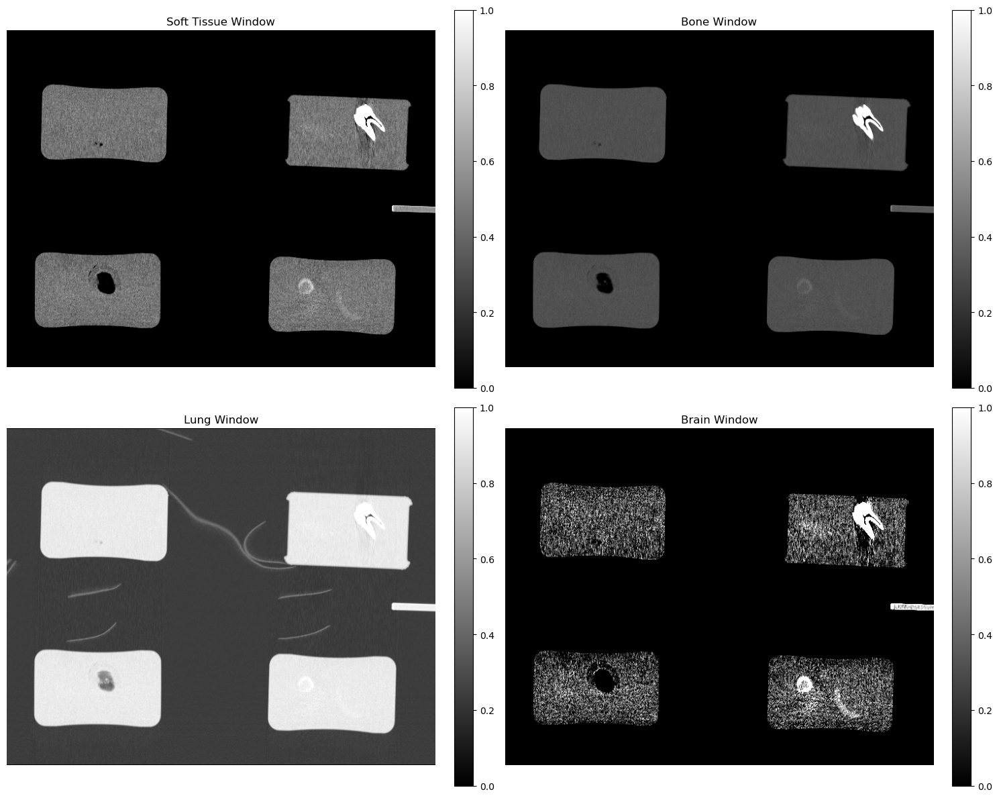

CT Windowing Results:
Soft Tissue: Contrast (std) = 0.2031
Bone: Contrast (std) = 0.1438
Lung: Contrast (std) = 0.2921
Brain: Contrast (std) = 0.1835


In [ ]:
# Problem: Standard methods often don't work well for CT because:
# 1. CT images have specific Hounsfield Unit ranges for different tissues
# 2. Air (-1000 HU) dominates the histogram, making enhancement less effective
# 3. We need to focus on specific tissue ranges

# Let's work with the original HU values and apply windowing + advanced methods
coronal_slice_hu = ct_img3d[274, :, :]  # Keep original Hounsfield Units
print("Original HU range:", np.min(coronal_slice_hu), "to", np.max(coronal_slice_hu))

# Method 1: CT Windowing (most important for medical imaging!)
def ct_window(image, window_center, window_width):
    """Apply CT windowing - standard medical imaging technique"""
    window_min = window_center - window_width // 2
    window_max = window_center + window_width // 2
    
    # Clip values to window range and normalize
    windowed = np.clip(image, window_min, window_max)
    windowed = (windowed - window_min) / (window_max - window_min)
    return windowed

# Standard CT windows
windows = {
    'Soft Tissue': (40, 400),    # Center=40 HU, Width=400 HU
    'Bone': (300, 1500),         # Center=300 HU, Width=1500 HU  
    'Lung': (-600, 1500),        # Center=-600 HU, Width=1500 HU
    'Brain': (40, 80)            # Center=40 HU, Width=80 HU
}

# Apply different windows
windowed_images = {}
for name, (center, width) in windows.items():
    windowed_images[name] = ct_window(coronal_slice_hu, center, width)

# Display windowed images
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

for i, (name, image) in enumerate(windowed_images.items()):
    im = axes[i].imshow(image, cmap='gray', vmin=0, vmax=1)
    axes[i].set_title(f'{name} Window')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

print("CT Windowing Results:")
for name, image in windowed_images.items():
    print(f"{name}: Contrast (std) = {np.std(image):.4f}")

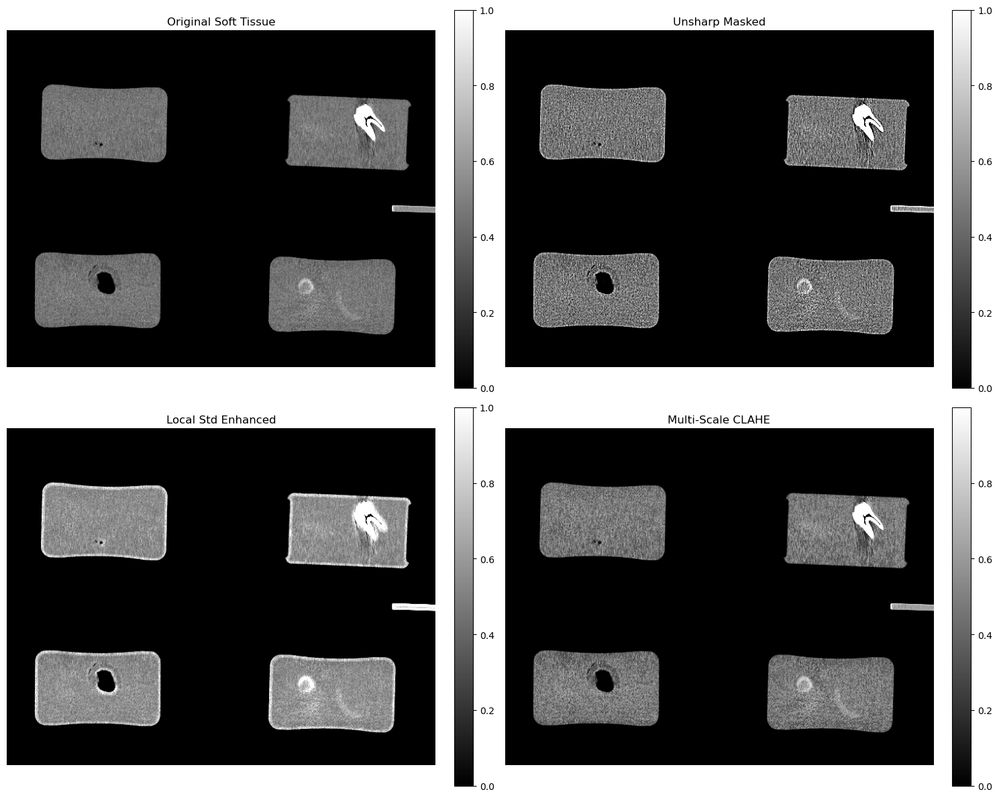

Advanced Enhancement Results:
Original Soft Tissue:
  Contrast (std): 0.2031
  Dynamic range: 1.0000

Unsharp Masked:
  Contrast (std): 0.2190
  Dynamic range: 1.0000

Local Std Enhanced:
  Contrast (std): 0.2630
  Dynamic range: 1.0000

Multi-Scale CLAHE:
  Contrast (std): 0.2108
  Dynamic range: 0.9999



In [ ]:
# Method 2: Advanced Contrast Enhancement after Windowing
# Apply enhancement to the soft tissue window (usually most relevant)
soft_tissue_windowed = windowed_images['Soft Tissue']

# Method 2a: Unsharp Masking - enhances edges and details
from scipy.ndimage import gaussian_filter
def unsharp_mask(image, radius=2.0, amount=1.5):
    """Apply unsharp masking for edge enhancement"""
    # Create blurred version
    blurred = gaussian_filter(image, sigma=radius)
    # Create mask (difference between original and blurred)
    mask = image - blurred
    # Apply mask back to original
    sharpened = image + amount * mask
    return np.clip(sharpened, 0, 1)

# Method 2b: Local Standard Deviation Enhancement
def local_std_enhancement(image, kernel_size=15):
    """Enhance based on local standard deviation"""
    from scipy.ndimage import generic_filter
    
    def local_std(arr):
        return np.std(arr)
    
    # Calculate local standard deviation
    local_std_map = generic_filter(image, local_std, size=kernel_size)
    # Normalize and use as enhancement factor
    enhancement_factor = 1 + 2 * (local_std_map / np.max(local_std_map))
    enhanced = image * enhancement_factor
    return np.clip(enhanced, 0, 1)

# Method 2c: Adaptive Contrast Enhancement with Multiple Scales
def multi_scale_enhancement(image, scales=[1, 2, 4]):
    """Multi-scale adaptive enhancement"""
    enhanced = image.copy()
    
    for scale in scales:
        # Apply CLAHE at different scales
        scaled_clahe = exposure.equalize_adapthist(
            image, 
            kernel_size=image.shape[0]//scale, 
            clip_limit=0.01
        )
        # Blend with original
        enhanced = 0.7 * enhanced + 0.3 * scaled_clahe
    
    return enhanced

# Apply advanced methods to soft tissue window
enhanced_methods = {
    'Original Soft Tissue': soft_tissue_windowed,
    'Unsharp Masked': unsharp_mask(soft_tissue_windowed, radius=1.5, amount=2.0),
    'Local Std Enhanced': local_std_enhancement(soft_tissue_windowed, kernel_size=10),
    'Multi-Scale CLAHE': multi_scale_enhancement(soft_tissue_windowed),
}

# Display enhanced results
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

for i, (name, image) in enumerate(enhanced_methods.items()):
    im = axes[i].imshow(image, cmap='gray')
    axes[i].set_title(f'{name}')
    axes[i].axis('off')
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

print("Advanced Enhancement Results:")
for name, image in enhanced_methods.items():
    contrast = np.std(image)
    dynamic_range = np.max(image) - np.min(image)
    print(f"{name}:")
    print(f"  Contrast (std): {contrast:.4f}")
    print(f"  Dynamic range: {dynamic_range:.4f}")
    print()

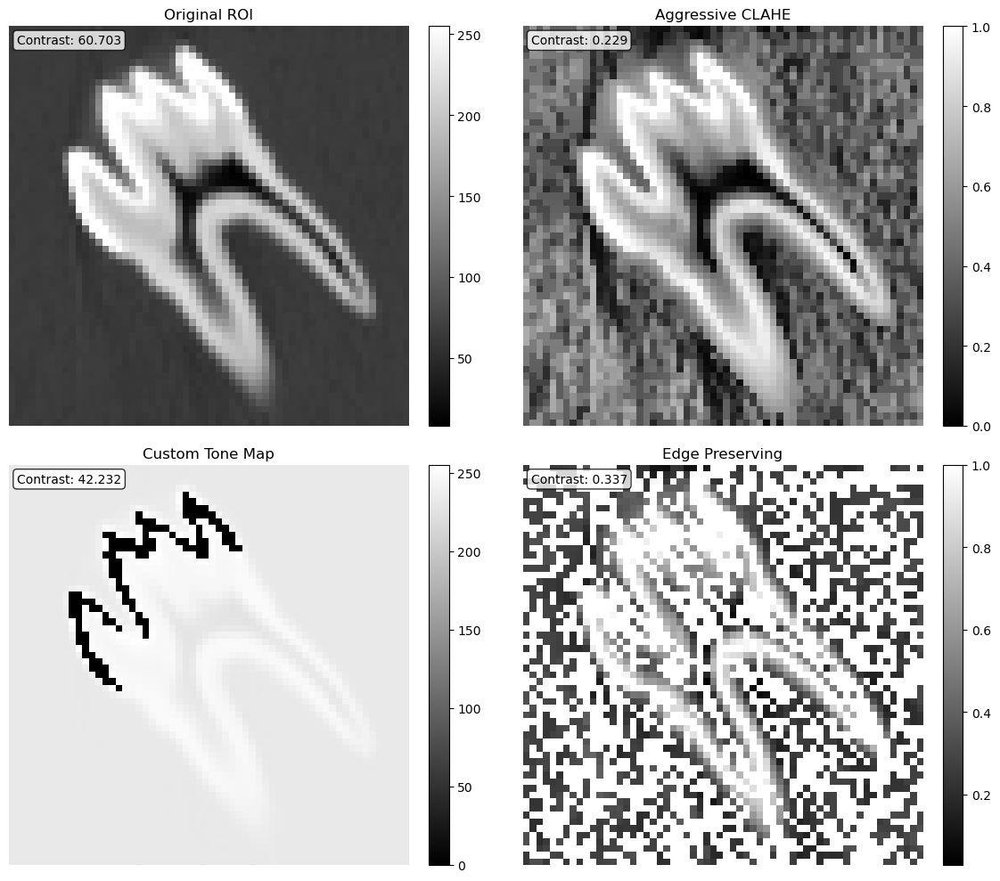

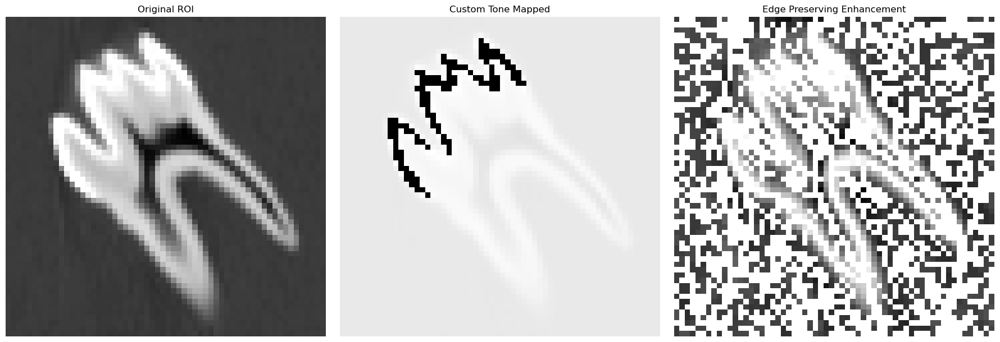

ROI Enhancement Results:
Original ROI:
  Contrast (std): 60.7028
  Detail metric: 20.7985

Aggressive CLAHE:
  Contrast (std): 0.2290
  Detail metric: 0.1090

Custom Tone Map:
  Contrast (std): 42.2323
  Detail metric: 26.8583

Edge Preserving:
  Contrast (std): 0.3369
  Detail metric: 0.2487



In [ ]:
# Method 3: Focus on Region of Interest (ROI) Enhancement
# Let's enhance just the area with your object for maximum effect
cropped_roi = normalized_cropped_coronal[40:100, 110:170]  # Your specific ROI

# Method 3a: Aggressive CLAHE parameters for small ROI
aggressive_clahe = exposure.equalize_adapthist(
    cropped_roi,
    kernel_size=cropped_roi.shape[0]//4,  # Smaller tiles for local enhancement
    clip_limit=0.1,  # Higher clip limit for more aggressive enhancement
    nbins=256
)

# Method 3b: Custom tone mapping
def custom_tone_map(image, shadows=0.2, highlights=0.8, gamma=0.7):
    """Custom tone mapping for better contrast"""
    # Separate shadows, midtones, highlights
    shadow_mask = image < shadows
    highlight_mask = image > highlights
    midtone_mask = ~(shadow_mask | highlight_mask)
    
    result = image.copy()
    
    # Enhance shadows
    result[shadow_mask] = np.power(result[shadow_mask] / shadows, gamma) * shadows
    
    # Enhance highlights  
    result[highlight_mask] = 1 - np.power((1 - result[highlight_mask]) / (1 - highlights), gamma) * (1 - highlights)
    
    # Enhance midtones with S-curve
    midtones = result[midtone_mask]
    if len(midtones) > 0:
        result[midtone_mask] = exposure.adjust_sigmoid(midtones, cutoff=0.5, gain=15)
    
    return result

# Method 3c: Edge-preserving smoothing + enhancement
from scipy.ndimage import median_filter
def edge_preserving_enhancement(image):
    """Enhance contrast while preserving edges"""
    # Smooth with median filter to preserve edges
    smoothed = median_filter(image, size=3)
    
    # Create detail layer
    details = image - smoothed
    
    # Enhance base layer
    enhanced_base = exposure.equalize_adapthist(smoothed, clip_limit=0.05)
    
    # Add enhanced details back
    result = enhanced_base + 2.0 * details
    return np.clip(result, 0, 1)

# Apply methods to ROI
roi_enhanced = {
    'Original ROI': cropped_roi,
    'Aggressive CLAHE': aggressive_clahe,
    'Custom Tone Map': custom_tone_map(cropped_roi),
    'Edge Preserving': edge_preserving_enhancement(cropped_roi)
}

# Display ROI enhancements
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()

for i, (name, image) in enumerate(roi_enhanced.items()):
    im = axes[i].imshow(image, cmap='gray')
    axes[i].set_title(f'{name}')
    axes[i].axis('off')
    
    # Add contrast statistics on image
    contrast = np.std(image)
    axes[i].text(0.02, 0.98, f'Contrast: {contrast:.3f}', 
                transform=axes[i].transAxes, 
                bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
                verticalalignment='top', fontsize=10)
    
    plt.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# Show side-by-side comparison of best methods
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Original
axes[0].imshow(cropped_roi, cmap='gray')
axes[0].set_title('Original ROI')
axes[0].axis('off')

# Best enhancement 1: Custom tone mapping
axes[1].imshow(custom_tone_map(cropped_roi), cmap='gray')
axes[1].set_title('Custom Tone Mapped')
axes[1].axis('off')

# Best enhancement 2: Edge preserving
axes[2].imshow(edge_preserving_enhancement(cropped_roi), cmap='gray')
axes[2].set_title('Edge Preserving Enhancement')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print("ROI Enhancement Results:")
for name, image in roi_enhanced.items():
    contrast = np.std(image)
    detail_metric = np.std(np.gradient(image))  # Edge sharpness metric
    print(f"{name}:")
    print(f"  Contrast (std): {contrast:.4f}")
    print(f"  Detail metric: {detail_metric:.4f}")
    print()